In [1]:
# import libraries
import math
import scipy
import numpy as np
import matplotlib as mpl
import scipy.integrate as integrate
import matplotlib.colors as colors
import matplotlib.cm as cmx
import pandas as pd
import seaborn as sns
from scipy.stats import skewnorm
from scipy.optimize import curve_fit
%matplotlib inline
import matplotlib.pyplot as plt

import re
import h5py
from scipy.interpolate import interp1d
import glob

from scipy import signal
from scipy import optimize, signal

from symfit import Parameter, Variable, Model
from symfit import Fit
#from symfit import NumericalLeastSquares
from symfit import parameters, variables, D, ODEModel, exp
from symfit.core.minimizers import BasinHopping
#from symfit.core.objectives import LogLikelihood
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

In [2]:
# constants in SI
mass_e = 9.10938291E-31 # mass of electron
q = 1.60217657E-19 # charge of electron
eV = 1.60217657E-19 # 1 electron volt in joules
ε = 8.85418782E-12 # permittivity of free space
h = 6.62606957E-34 # planck number
h_ev = 4.135667662E-15 #Plank number eV.s
hbar = 1.054571800E-34 # reduced planck constant
Rydberg = 2.1787E-18 # Rydberg energy (in joules)
avogadro = 6.02214179E23
c = 299792458 # m/s
sigma_ev = 3.54E11 #ev/m^2/s/K^4
sigma = 5.670367E-8 #J/m^2/s/K^4
# units in SI
Å = 1E-10 # m to angstrom
k = 1.38064852E-23 #J/K
k_ev = 8.6173303E-5 #ev/K

In [3]:
def peak_max(x_array,y_array, valuerange_low, valuerange_high):
    idx_lo = (np.abs(x_array - valuerange_low)).argmin()
    idx_hi = (np.abs(x_array - valuerange_high)).argmin()
    max_peak = max(y_array[idx_lo:idx_hi])
    return max_peak
def find_nearest_idx(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx
def find_zero_idx_range(xarray,y1, y2,xmin,xmax):
    i1 = find_nearest_idx(xarray,xmin)
    i2 = find_nearest_idx(xarray,xmax)
    idx_zero = find_nearest_idx((y1[i1:i2]-y2[i1:i2]),0)
    return idx_zero
def background_f(x_array,y_array, valuerange_low, valuerange_high):
    idx_lo = (np.abs(x_array - valuerange_low)).argmin()
    idx_hi = (np.abs(x_array - valuerange_high)).argmin()
    background_val = np.mean(y_array[idx_lo:idx_hi])
    return background_val

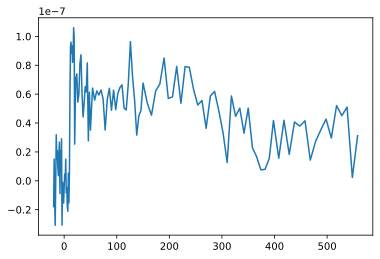

In [116]:
data = glob.glob('Y6 series Thz/5mw_kinetic_shifted_t0_y6_blend_1_1/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')
    Thz_i = Thz_indiv_r[:,0]
    sig.append(Thz_i)
Thz_avg_2 = np.mean(sig,0)+3.3e-7
plt.plot(time,Thz_avg_2)

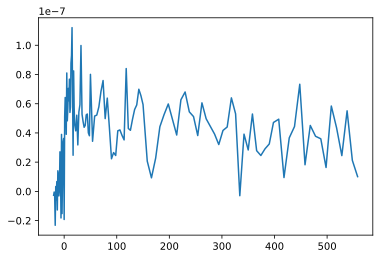

In [56]:
data = glob.glob('Y6 series Thz/5mW_kinetic_y6_blend_1_1/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')
    Thz_i = Thz_indiv_r[:,0]
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)+2.5e-7
plt.plot(time,Thz_avg)

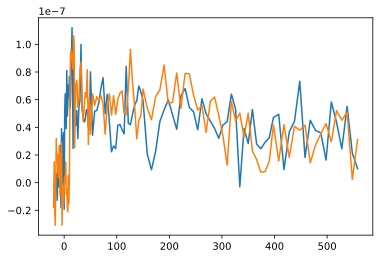

In [57]:
plt.plot(time,Thz_avg)
plt.plot(time,Thz_avg_2)

(-10, 200)

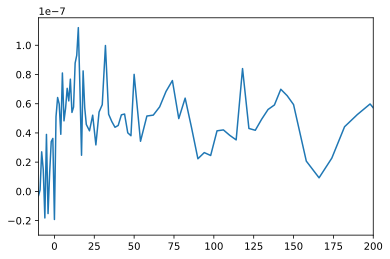

In [60]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
ax.set_xlim(-10,200)

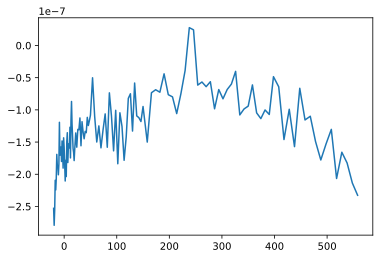

In [53]:
data = glob.glob('Y6 series Thz/1mW_kinetics_y6_blend_1_1/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')
    Thz_i = Thz_indiv_r[:,0]
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)+2.5e-7
plt.plot(time,Thz_avg)

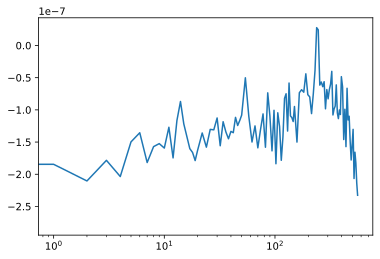

In [54]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
ax.set_xscale('log')

(-20, 200)

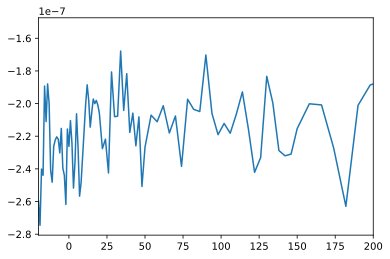

In [62]:
data = glob.glob('Y6 series Thz/1mW_kinetics_newt0_y6_blend_1_1/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')
    Thz_i = Thz_indiv_r[:,0]
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)+2.5e-7
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
ax.set_xlim(-20,200)

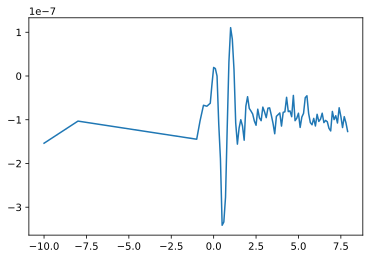

In [119]:
data = glob.glob('Y6 series Thz/5mW_spec_y6_blend_1_1_3ps/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')
    Thz_i = Thz_indiv_r[:,0]
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)+2.5e-7
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)


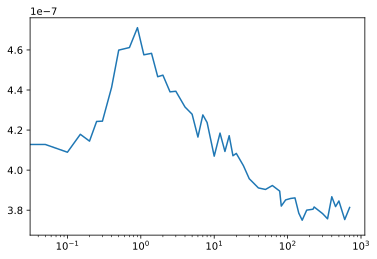

In [4]:
data = glob.glob('Y6 series Thz/y6_406p9_1_mW_2ps/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')
    Thz_i = Thz_indiv_r[:,0]
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)+2.5e-7
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
ax.set_xscale('log')
#ax.set_xlim(-20,200)

In [127]:
Thz_avg

array([3.83872587e-07, 3.89964027e-07, 3.83133350e-07, 3.76611060e-07,
       3.80158887e-07, 3.72489953e-07, 3.74710595e-07, 3.76724615e-07,
       3.76579090e-07, 3.78214677e-07, 3.76325810e-07, 3.85371460e-07,
       3.87231147e-07, 3.87338780e-07, 4.02240058e-07, 4.03730202e-07,
       4.12813480e-07, 4.08939747e-07, 4.17886380e-07, 4.14484087e-07,
       4.24303775e-07, 4.24446425e-07, 4.41317905e-07, 4.59909575e-07,
       4.61190050e-07, 4.71111800e-07, 4.57563847e-07, 4.58294350e-07,
       4.46629350e-07, 4.47409300e-07, 4.39076800e-07, 4.39376712e-07,
       4.31507000e-07, 4.27909663e-07, 4.16512600e-07, 4.27563425e-07,
       4.23788750e-07, 4.06978200e-07, 4.18485865e-07, 4.09332725e-07,
       4.17187812e-07, 4.07184775e-07, 4.08348947e-07, 4.02225512e-07,
       3.95723753e-07, 3.91122363e-07, 3.90356942e-07, 3.92327218e-07,
       3.89547763e-07, 3.82056475e-07, 3.85144420e-07, 3.85863295e-07,
       3.86154280e-07, 3.78531945e-07, 3.75007420e-07, 3.80036630e-07,
      

In [123]:
import win32clipboard as clipboard

def toClipboardForExcel(array):
    """
    Copies an array into a string format acceptable by Excel.
    Columns separated by \t, rows separated by \n
    """
    # Create string from array
    line_strings = []
    for line in array:
        line_strings.append("\t".join(line.astype(str)).replace("\n",""))
    array_string = "\r\n".join(line_strings)

    # Put string into clipboard (open, clear, set, close)
    clipboard.OpenClipboard()
    clipboard.EmptyClipboard()
    clipboard.SetClipboardText(array_string)
    clipboard.CloseClipboard()

In [135]:
toClipboardForExcel([time])

C:\Users\pricemi\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:14: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  


(0.004232315599763728, 700)

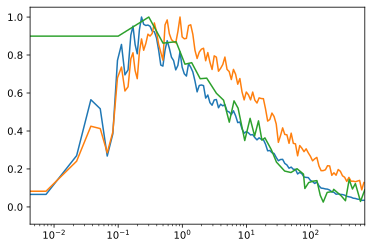

In [130]:
Thz = Thz_avg-min(Thz_avg)


TA= np.genfromtxt('Y6 series Thz/TA (2) Y6 neat St [Film] 72uW (700-fs) DUAL_kin.txt', dtype = 'float64')
time_TA = TA[:,0]
TA_kin_1 = -1*TA[:,1]
TA_kin_2 = -1*TA[:,2]
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time_TA,TA_kin_1/max(TA_kin_1))
ax.plot(time_TA,TA_kin_2/max(TA_kin_2))
ax.plot(time-.6,Thz/max(Thz))
ax.set_xscale('log')
ax.set_xlim(-10,700)

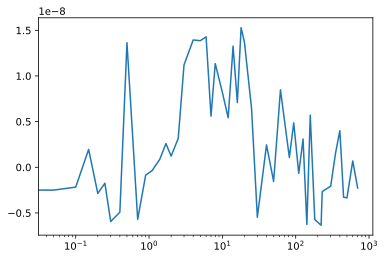

In [132]:
data = glob.glob('Y6 series Thz/y6_406p9_200_uW/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,0]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-15,.5)
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
ax.set_xscale('log')
#ax.set_xlim(-20,20)

C:\Users\pricemi\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:14: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  


(0.004233043073294607, 600)

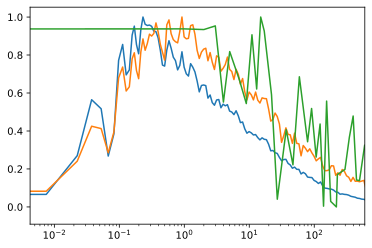

In [133]:
Thz = Thz_avg-min(Thz_avg)


TA= np.genfromtxt('Y6 series Thz/TA (2) Y6 neat St [Film] 72uW (700-fs) DUAL_kin.txt', dtype = 'float64')
time_TA = TA[:,0]
TA_kin_1 = -1*TA[:,1]
TA_kin_2 = -1*TA[:,2]
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time_TA,TA_kin_1/max(TA_kin_1))
ax.plot(time_TA,TA_kin_2/max(TA_kin_2))
ax.plot(time-3,Thz/max(Thz))
ax.set_xscale('log')
ax.set_xlim(-20,600)

(0, 10)

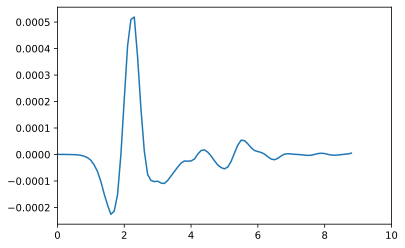

In [445]:
data = glob.glob('Y6 series Thz/y6_neat_steadystate/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[0]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,0]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-8,0)
    sig.append(Thz_i)
#Thz_avg = np.mean(sig,0)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_i)
ax.set_xlim(0,10)
#ax.set_xscale('log')

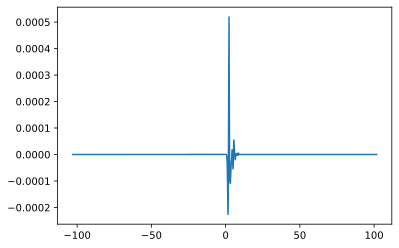

In [446]:
##pad the terahertz time spectra
Thz = Thz_i

N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
plt.plot(t_pad,Thz_pad)

(0, 3000000000000.0)

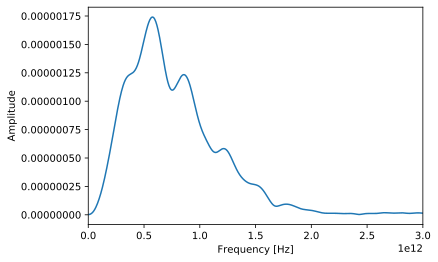

In [447]:
##now plot FFT


fft_on = np.fft.fft(Thz_pad)


# 1/T = frequency
f_on = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft_on)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,3e12)
#plt.plot(f[:N_size // 2], np.abs(fft)[:N_size // 2] * 1 / N_size)

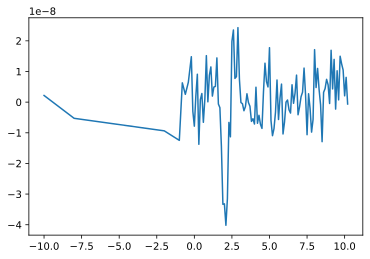

In [259]:
data = glob.glob('Y6 series Thz/y6_759p_spec_1mW/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,0]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-8,0)
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
#ax.set_xscale('log')

(0, 3000000000000.0)

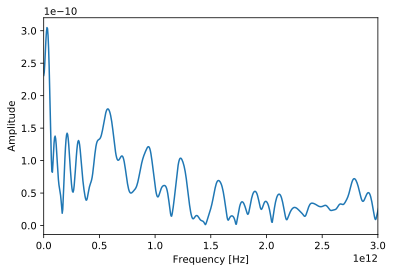

In [260]:
##pad the terahertz time spectra
Thz = Thz_avg

N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
#plt.plot(t_pad,Thz_pad)
fft1 = np.fft.fft(Thz_pad)


# 1/T = frequency
f = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft1)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,3e12)

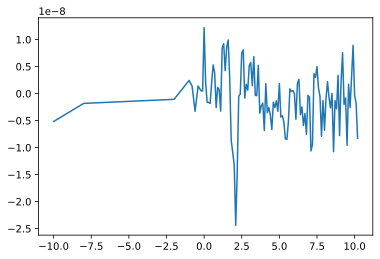

In [261]:
data = glob.glob('Y6 series Thz/y6_753p_spec_1mW/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,0]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-8,0)
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
#ax.set_xscale('log')

(0, 3000000000000.0)

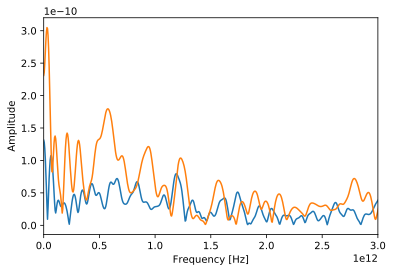

In [262]:
Thz = Thz_avg

N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
#plt.plot(t_pad,Thz_pad)
fft2 = np.fft.fft(Thz_pad)


# 1/T = frequency
f = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft2)[:N_size // 2] * 1 / N_size)
ax.plot(f[:N_size // 2], np.abs(fft1)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,3e12)

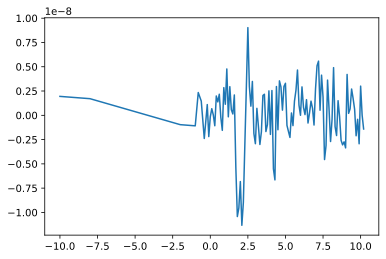

In [263]:
data = glob.glob('Y6 series Thz/y6_705p_spec_1_mW/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,0]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-8,0)
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
#ax.set_xscale('log')

(0, 3000000000000.0)

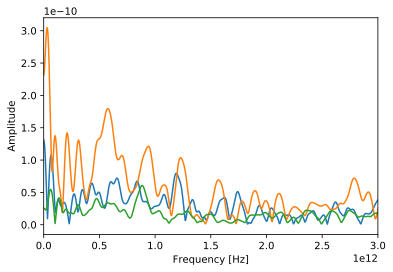

In [264]:
Thz = Thz_avg

N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
#plt.plot(t_pad,Thz_pad)
fft = np.fft.fft(Thz_pad)


# 1/T = frequency
f = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft2)[:N_size // 2] * 1 / N_size)
ax.plot(f[:N_size // 2], np.abs(fft1)[:N_size // 2] * 1 / N_size)
ax.plot(f[:N_size // 2], np.abs(fft)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,3e12)

(0, 5000000000000.0)

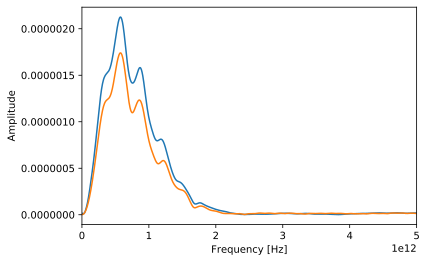

In [485]:
data = glob.glob('Y6 series Thz/y6_blank_steadystate/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[0]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,0]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-8,0)
    sig.append(Thz_i)
#Thz_avg = np.mean(sig,0)
Thz = Thz_i

N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
fft_blank = np.fft.fft(Thz_pad)
f_blank = np.linspace(0, 1 / (spacing*1e-12), N_size)

# 1/T = frequency
freq = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f_blank[:N_size // 2], np.abs(fft_blank)[:N_size // 2] * 1 / N_size)
ax.plot(f_on[:N_size // 2], np.abs(fft_on)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,5e12)

(0, 5000000000000.0)

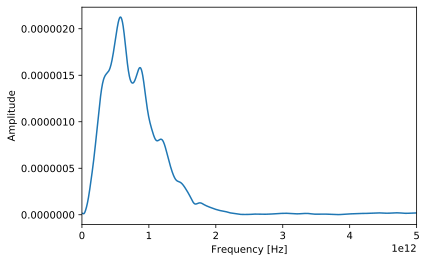

In [508]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f_blank[:N_size // 2], np.abs(fft_blank)[:N_size // 2] * 1 / N_size)
#ax.plot(f[:N_size // 2], np.abs(fft_on)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,5e12)

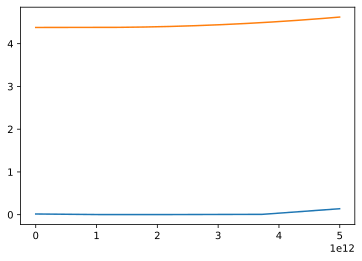

In [11]:
f= f_no[:N_size // 2] #frequency
values = range(len(f))
n_subs = []
for idx in values:
    if f[idx] < 1*1e12: 
        n_subs.append(2.0928)
    else:
        n_subs.append(2.0959-0.0066*f[idx]*1e-12+0.0035*(f[idx]*1e-12)**2)

        
k_subs_data = np.genfromtxt("Y6 series Thz/quartz_extinction_Thz.csv",dtype = 'float64', delimiter=',')
k_freq = k_subs_data[:,0]*1e12
k_subs_no_int = k_subs_data[:,1]
k_interp_f = interp1d(k_freq,k_subs_no_int,fill_value="extrapolate")
k_subs = k_interp_f(f)

e_subs = (n_subs+1j*k_subs)**2
plt.plot(f,e_subs.imag)
plt.plot(f,e_subs.real)

In [455]:
d = 140e-9 #thickness nm
#f= freq[:N_size // 2] #frequency
#c = speed of light
a = e_subs#epsilon_substrate
y=fft_no[:N_size // 2]/fft_blank[:N_size // 2]

In [456]:
epsilon = 1/8 * ( d )**( -2 ) * ( f )**( -2 ) * ( np.pi )**( -2 ) * ( y )**( \
-2 ) * ( -1 * d * f * np.pi * ( -4 * d * f * np.pi + ( -8 * ( a )**( \
1/2 ) * d * f * np.pi + ( -4 * a * d * f * np.pi + ( complex( 0,-4 ) \
* c * y + ( complex( 0,-4 ) * ( a )**( 1/2 ) * c * y + ( 8 * d * f * \
np.pi * y + ( 16 * ( a )**( 1/2 ) * d * f * np.pi * y + ( 8 * a * d * \
f * np.pi * y + ( complex( 0,4 ) * c * ( y )**( 2 ) + ( complex( 0,4 \
) * ( a )**( 1/2 ) * c * ( y )**( 2 ) + ( -12 * d * f * np.pi * ( y \
)**( 2 ) + ( -8 * ( a )**( 1/2 ) * d * f * np.pi * ( y )**( 2 ) + -4 \
* a * d * f * np.pi * ( y )**( 2 ) ) ) ) ) ) ) ) ) ) ) ) ) + -1 * ( ( \
( d )**( 2 ) * ( f )**( 2 ) * ( np.pi )**( 2 ) * ( ( -4 * d * f * \
np.pi + ( -8 * ( a )**( 1/2 ) * d * f * np.pi + ( -4 * a * d * f * \
np.pi + ( complex( 0,-4 ) * c * y + ( complex( 0,-4 ) * ( a )**( 1/2 \
) * c * y + ( 8 * d * f * np.pi * y + ( 16 * ( a )**( 1/2 ) * d * f * \
np.pi * y + ( 8 * a * d * f * np.pi * y + ( complex( 0,4 ) * c * ( y \
)**( 2 ) + ( complex( 0,4 ) * ( a )**( 1/2 ) * c * ( y )**( 2 ) + ( \
-12 * d * f * np.pi * ( y )**( 2 ) + ( -8 * ( a )**( 1/2 ) * d * f * \
np.pi * ( y )**( 2 ) + -4 * a * d * f * np.pi * ( y )**( 2 ) ) ) ) ) \
) ) ) ) ) ) ) ) )**( 2 ) + -16 * ( d )**( 2 ) * ( f )**( 2 ) * ( \
np.pi )**( 2 ) * ( y )**( 2 ) * ( -1 * ( c )**( 2 ) + ( -2 * ( a )**( \
1/2 ) * ( c )**( 2 ) + ( -1 * a * ( c )**( 2 ) + ( 2 * ( c )**( 2 ) * \
y + ( 4 * ( a )**( 1/2 ) * ( c )**( 2 ) * y + ( 2 * a * ( c )**( 2 ) \
* y + ( complex( 0,4 ) * c * d * f * np.pi * y + ( complex( 0,4 ) * ( \
a )**( 1/2 ) * c * d * f * np.pi * y + ( -1 * ( c )**( 2 ) * ( y )**( \
2 ) + ( -2 * ( a )**( 1/2 ) * ( c )**( 2 ) * ( y )**( 2 ) + ( -1 * a \
* ( c )**( 2 ) * ( y )**( 2 ) + ( complex( 0,-4 ) * c * d * f * np.pi \
* ( y )**( 2 ) + ( complex( 0,-4 ) * ( a )**( 1/2 ) * c * d * f * \
np.pi * ( y )**( 2 ) + 4 * ( d )**( 2 ) * ( f )**( 2 ) * ( np.pi )**( \
2 ) * ( y )**( 2 ) ) ) ) ) ) ) ) ) ) ) ) ) ) ) )**( 1/2 ) )

C:\Users\pricemi\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in power
  
C:\Users\pricemi\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in multiply
  
C:\Users\pricemi\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in multiply


(-5000, 5000)

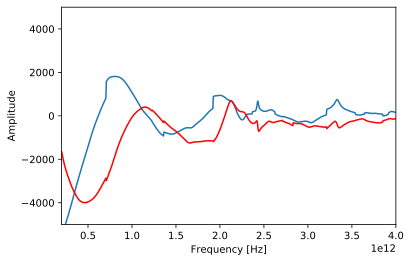

In [457]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f,epsilon.real)
ax.plot(f,epsilon.imag,color = 'red')
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0.2e12,4e12)
ax.set_ylim(-5000,5000)

C:\Users\pricemi\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


(-10, 10)

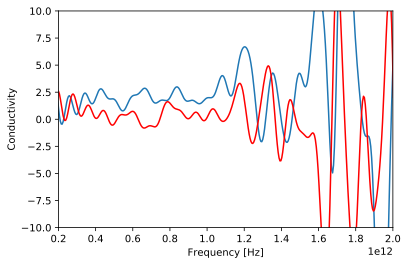

In [504]:
y_pump = fft2[:N_size // 2]/fft_blank[:N_size // 2]

delta_eps = 2*epsilon*y_pump/(1j*np.sqrt(epsilon)*2*np.pi*f*d/c-(np.sqrt(epsilon)-1)/(np.sqrt(epsilon)+1))

delta_sigma = -2*np.pi*1j*f*ε*(delta_eps-1)
delta_sigma_approx = -1j*c*np.sqrt(epsilon)/(np.pi*f*d)*y_pump
delta_sigma_approx_2 = -1*(2.4+1)/(337*d)*y_pump#from Yi Liao 2020

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f,delta_sigma_approx_2.real)
ax.plot(f,delta_sigma_approx_2.imag,color = "red")
ax.set_ylabel("Conductivity")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0.2e12,2e12)
ax.set_ylim(-10,10)
#ax.set_ylim(-2,2)

(-0.0001, 0.0001)

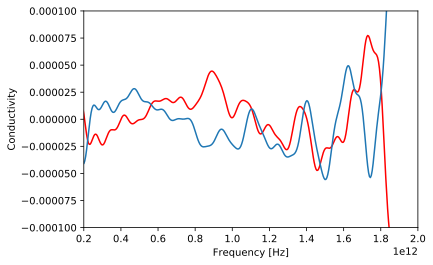

In [407]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f,y_pump.imag,color = "red")
ax.plot(f,y_pump.real)
ax.set_ylabel("Conductivity")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0.2e12,2e12)
ax.set_ylim(-1e-4,1e-4)

C:\Users\pricemi\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


(-2, 2)

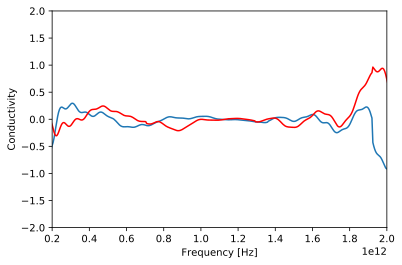

In [469]:
y_pump = fft[:N_size // 2]/fft_on[:N_size // 2]

delta_eps = 2*epsilon*y_pump/(1j*np.sqrt(epsilon)*2*np.pi*f*d/c-(np.sqrt(epsilon)-1)/(np.sqrt(epsilon)+1))

delta_sigma_herz = -ε*c*(2.13+1)*y_pump

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f,delta_eps.real)
ax.plot(f,delta_eps.imag,color = "red")
ax.set_ylabel("Conductivity")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0.2e12,2e12)
#ax.set_ylim(-1e-6,1e-6)
ax.set_ylim(-2, 2)

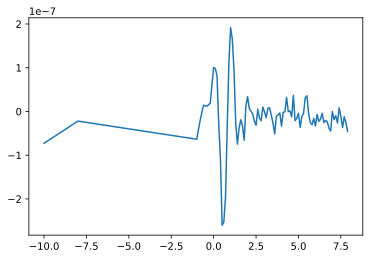

In [463]:
data = glob.glob('Y6 series Thz/5mW_spec_y6_blend_1_1_3ps/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,0]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-8,0)
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
#ax.set_xscale('log')

Text(0.5, 0, 'Frequency [Hz]')

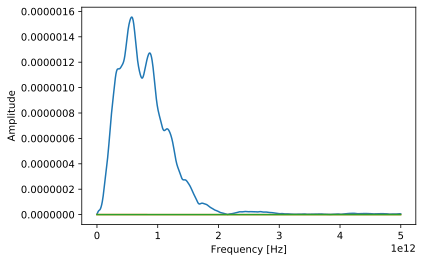

In [703]:
Thz = Thz_avg

N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
#plt.plot(t_pad,Thz_pad)
fft_blend = np.fft.fft(Thz_pad)


# 1/T = frequency
f_blend = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft_blend)[:N_size // 2] * 1 / N_size)
ax.plot(f[:N_size // 2], np.abs(fft1)[:N_size // 2] * 1 / N_size)
ax.plot(f[:N_size // 2], np.abs(fft)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
#ax.set_xlim(0,3e12)

(0, 3000000000000.0)

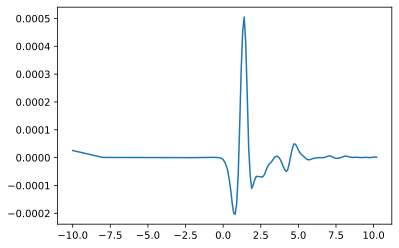

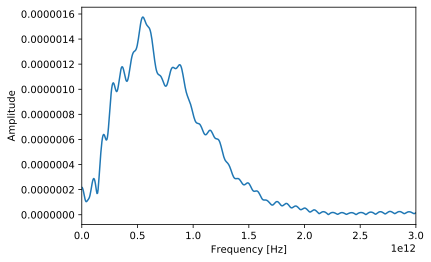

In [704]:
data = glob.glob('Y6 series Thz/perovskite_new_blank_spec/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,0]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-8,0)
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)

#ax.set_xscale('log')
Thz = Thz_avg#*np.hanning(Thz_off.size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz)
N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
#plt.plot(t_pad,Thz_pad)
fft_no = np.fft.fft(Thz_pad)
freq1 = np.fft.fftfreq(Thz_pad.shape[-1])

# 1/T = frequency
f = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft_no)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,3e12)


(0, 3000000000000.0)

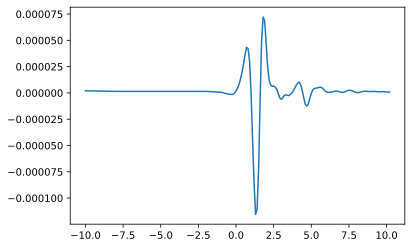

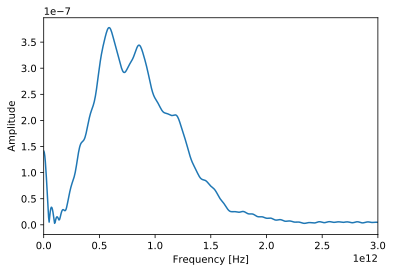

In [705]:
data = glob.glob('Y6 series Thz/perovskite_new_spec/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,0]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-8,0)
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
#ax.set_xscale('log')
Thz = Thz_avg#*np.hanning(Thz_avg.size)
N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
#plt.plot(t_pad,Thz_pad)
fft_on = np.fft.fft(Thz_pad)


# 1/T = frequency
f = np.linspace(0, 1 / (spacing*1e-12), N_size)
freq2 = np.fft.fftfreq(Thz_pad.shape[-1])
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft_on)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,3e12)

(-25000, 75000)

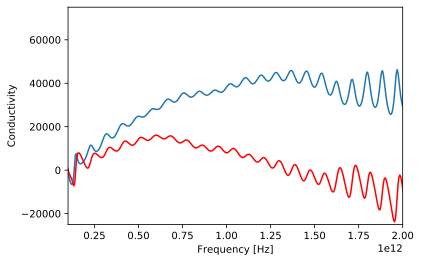

In [706]:
y_pump = fft_on[:N_size // 2]/fft_no[:N_size // 2]
#y_pump = yyy[:N_size//2]
#delta_eps = 2*epsilon*y_pump/(1j*np.sqrt(epsilon)*2*np.pi*f*d/c-(np.sqrt(epsilon)-1)/(np.sqrt(epsilon)+1))

#delta_sigma = -2*np.pi*1j*f*ε*(delta_eps-1)
#delta_sigma_approx = -1j*c*np.sqrt(epsilon)/(np.pi*f*d)*y_pump
delta_sigma_approx_2 = -1*ε*c*(2.4+1)/d*y_pump#-1*(2.4+1)/(337*d)*y_pump#from Yi Liao 2020

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2],delta_sigma_approx_2.real)
ax.plot(f[:N_size // 2],delta_sigma_approx_2.imag,color = "red")
ax.set_ylabel("Conductivity")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0.1e12,2e12)
#ax.set_xlim(-4e12,-0.1e12)
ax.set_ylim(-25000,75000)
#ax.set_ylim(-2,2)

(0, 3000000000000.0)

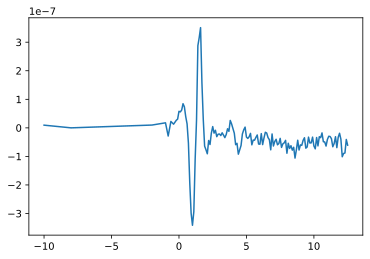

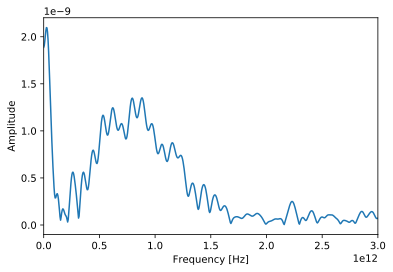

In [688]:
data = glob.glob('Y6 series Thz/Y6_1_1_blend_55ps_spec_6mW/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,0]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-7,-3)
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)

Thz_avg_on = Thz_avg
#ax.set_xscale('log')
Thz = Thz_avg

N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
#plt.plot(t_pad,Thz_pad)
fft_on = np.fft.fft(Thz_pad)


# 1/T = frequency
f = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft_on)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,3e12)

(0, 3000000000000.0)

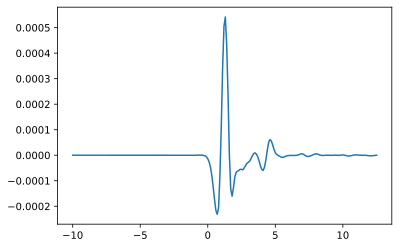

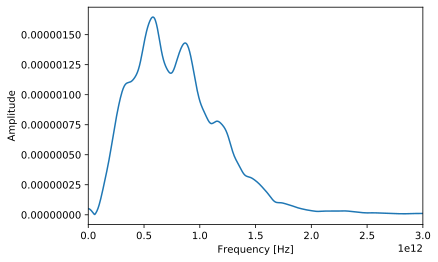

In [689]:
data = glob.glob('Y6 series Thz/Y6_1_1_blend_steady_end/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,0]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-7,-3)
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)
Thz_avg_steady = Thz_avg
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
#ax.set_xscale('log')
Thz = Thz_avg

N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
#plt.plot(t_pad,Thz_pad)
fft_no = np.fft.fft(Thz_pad)


# 1/T = frequency
f_no = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft_no)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,3e12)

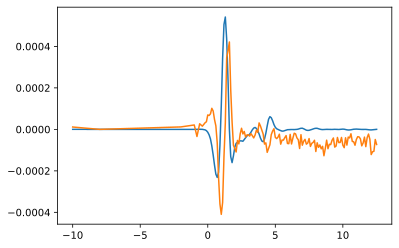

In [690]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time, Thz_avg_steady)
ax.plot(time,Thz_avg_on*1200)

(0, 3000000000000.0)

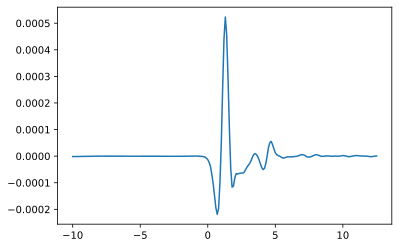

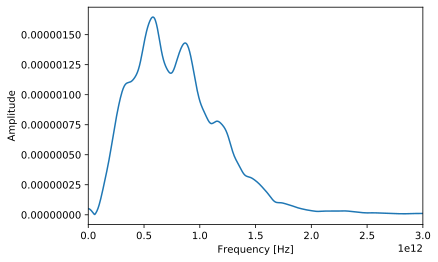

In [696]:
data = glob.glob('Y6 series Thz/Y6_1_1_blend_steady_blank/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,0]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-7,-3)
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
#ax.set_xscale('log')
Thz = Thz_avg

N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
#plt.plot(t_pad,Thz_pad)
fft_blank = np.fft.fft(Thz_pad)


# 1/T = frequency
f_no = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft_no)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,3e12)

In [697]:
d = 70e-9 #thickness nm
f= f_no[:N_size // 2] #frequency
#c = speed of light
a = e_subs#epsilon_substrate
y=fft_no[:N_size // 2]/fft_blank[:N_size // 2]

epsilon = 1/8 * ( d )**( -2 ) * ( f )**( -2 ) * ( np.pi )**( -2 ) * ( y )**( \
-2 ) * ( -1 * d * f * np.pi * ( -4 * d * f * np.pi + ( -8 * ( a )**( \
1/2 ) * d * f * np.pi + ( -4 * a * d * f * np.pi + ( complex( 0,-4 ) \
* c * y + ( complex( 0,-4 ) * ( a )**( 1/2 ) * c * y + ( 8 * d * f * \
np.pi * y + ( 16 * ( a )**( 1/2 ) * d * f * np.pi * y + ( 8 * a * d * \
f * np.pi * y + ( complex( 0,4 ) * c * ( y )**( 2 ) + ( complex( 0,4 \
) * ( a )**( 1/2 ) * c * ( y )**( 2 ) + ( -12 * d * f * np.pi * ( y \
)**( 2 ) + ( -8 * ( a )**( 1/2 ) * d * f * np.pi * ( y )**( 2 ) + -4 \
* a * d * f * np.pi * ( y )**( 2 ) ) ) ) ) ) ) ) ) ) ) ) ) + -1 * ( ( \
( d )**( 2 ) * ( f )**( 2 ) * ( np.pi )**( 2 ) * ( ( -4 * d * f * \
np.pi + ( -8 * ( a )**( 1/2 ) * d * f * np.pi + ( -4 * a * d * f * \
np.pi + ( complex( 0,-4 ) * c * y + ( complex( 0,-4 ) * ( a )**( 1/2 \
) * c * y + ( 8 * d * f * np.pi * y + ( 16 * ( a )**( 1/2 ) * d * f * \
np.pi * y + ( 8 * a * d * f * np.pi * y + ( complex( 0,4 ) * c * ( y \
)**( 2 ) + ( complex( 0,4 ) * ( a )**( 1/2 ) * c * ( y )**( 2 ) + ( \
-12 * d * f * np.pi * ( y )**( 2 ) + ( -8 * ( a )**( 1/2 ) * d * f * \
np.pi * ( y )**( 2 ) + -4 * a * d * f * np.pi * ( y )**( 2 ) ) ) ) ) \
) ) ) ) ) ) ) ) )**( 2 ) + -16 * ( d )**( 2 ) * ( f )**( 2 ) * ( \
np.pi )**( 2 ) * ( y )**( 2 ) * ( -1 * ( c )**( 2 ) + ( -2 * ( a )**( \
1/2 ) * ( c )**( 2 ) + ( -1 * a * ( c )**( 2 ) + ( 2 * ( c )**( 2 ) * \
y + ( 4 * ( a )**( 1/2 ) * ( c )**( 2 ) * y + ( 2 * a * ( c )**( 2 ) \
* y + ( complex( 0,4 ) * c * d * f * np.pi * y + ( complex( 0,4 ) * ( \
a )**( 1/2 ) * c * d * f * np.pi * y + ( -1 * ( c )**( 2 ) * ( y )**( \
2 ) + ( -2 * ( a )**( 1/2 ) * ( c )**( 2 ) * ( y )**( 2 ) + ( -1 * a \
* ( c )**( 2 ) * ( y )**( 2 ) + ( complex( 0,-4 ) * c * d * f * np.pi \
* ( y )**( 2 ) + ( complex( 0,-4 ) * ( a )**( 1/2 ) * c * d * f * \
np.pi * ( y )**( 2 ) + 4 * ( d )**( 2 ) * ( f )**( 2 ) * ( np.pi )**( \
2 ) * ( y )**( 2 ) ) ) ) ) ) ) ) ) ) ) ) ) ) ) )**( 1/2 ) )

C:\Users\pricemi\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in power
  
C:\Users\pricemi\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in multiply
  
C:\Users\pricemi\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in multiply


(-500, 500)

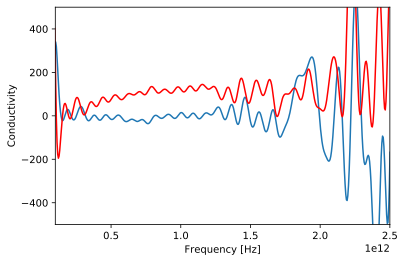

In [698]:
y_pump = (fft_on[:N_size // 2])/fft_no[:N_size // 2]
#delta_eps = 2*epsilon*y_pump/(1j*np.sqrt(epsilon)*2*np.pi*f*d/c-(np.sqrt(epsilon)-1)/(np.sqrt(epsilon)+1))

#delta_sigma = -2*np.pi*1j*f*ε*(delta_eps-1)
#delta_sigma_approx = -1j*c*np.sqrt(epsilon)/(np.pi*f*d)*y_pump
delta_sigma_approx_2 = -1*ε*c*(2.4+1)/d*y_pump#from joyce jonshton#-2*ε*c*2.4/d*y_pump from rumbles or -1*(2.4+1)/(337*d)*y_pump#from Yi Liao 2020

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2],delta_sigma_approx_2[:N_size // 2].real)
ax.plot(f[:N_size // 2],delta_sigma_approx_2[:N_size // 2].imag,color = "red")
ax.set_ylabel("Conductivity")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0.1e12,2.5e12)
ax.set_ylim(-500,500)
#ax.set_ylim(-2,2)

(-500, 500)

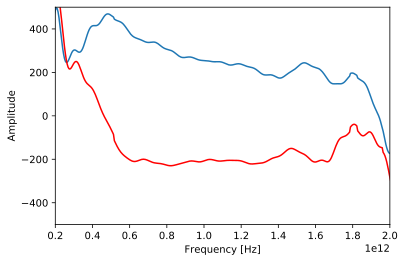

In [41]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f,epsilon.real)
ax.plot(f,epsilon.imag,color = 'red')
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0.2e12,2e12)
ax.set_ylim(-500,500)

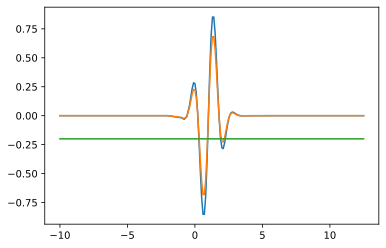

In [113]:
yy1 = np.sin(4*(time-1))*np.exp(-(time-1)**2)
yy_on= .8*np.sin(4*(time-1))*np.exp(-(time-1)**2)
yy2 = (yy_on-yy1)/yy1
plt.plot(time,yy1)
plt.plot(time,yy_on)
plt.plot(time,yy2)

Text(0.5, 0, 'Frequency [Hz]')

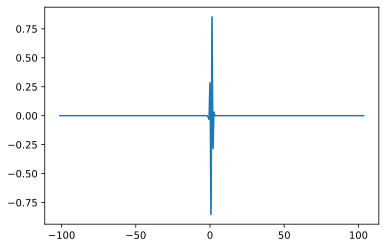

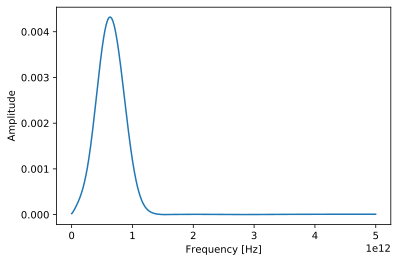

In [114]:
N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
yy1_f = interp1d(time,yy1,fill_value="extrapolate")
yy1_interp = yy1_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
yy1_pad = np.pad(yy1_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
plt.plot(t_pad,yy1_pad)


fft_1 = np.fft.fft(yy1_pad)


# 1/T = frequency
f = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft_1)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
#ax.set_xlim(0,3e12)

Text(0.5, 0, 'Frequency [Hz]')

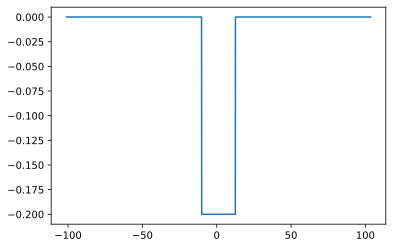

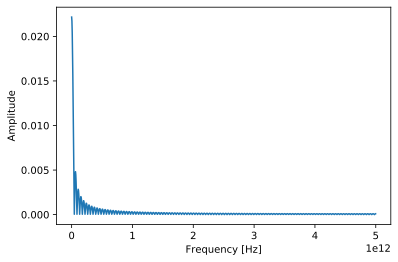

In [115]:
N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
yy2_f = interp1d(time,yy2,fill_value="extrapolate")
yy2_interp = yy2_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
yy2_pad = np.pad(yy2_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
plt.plot(t_pad,yy2_pad)


fft_2 = np.fft.fft(yy2_pad)


# 1/T = frequency
f = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft_2)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
#ax.set_xlim(0,3e12)

(-150000, 150000)

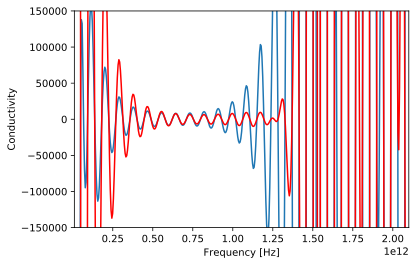

In [122]:
y_pump = fft_2[:N_size // 2]/fft_1[:N_size // 2]

#delta_eps = 2*epsilon*y_pump/(1j*np.sqrt(epsilon)*2*np.pi*f*d/c-(np.sqrt(epsilon)-1)/(np.sqrt(epsilon)+1))

#delta_sigma = -2*np.pi*1j*f*ε*(delta_eps-1)
#delta_sigma_approx = -1j*c*np.sqrt(epsilon)/(np.pi*f*d)*y_pump
delta_sigma_approx_2 = -1*(2.4+1)/(337*d)*y_pump#from Yi Liao 2020

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2],delta_sigma_approx_2.real)
ax.plot(f[:N_size // 2],delta_sigma_approx_2.imag,color = "red")
ax.set_ylabel("Conductivity")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0.01e12,2.1e12)
ax.set_ylim(-150000,150000)
#ax.set_ylim(-2,2)

(0, 3000000000000.0)

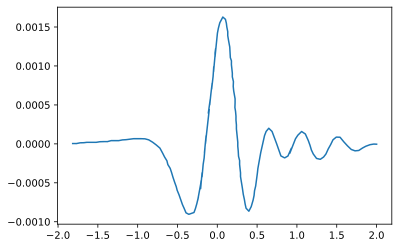

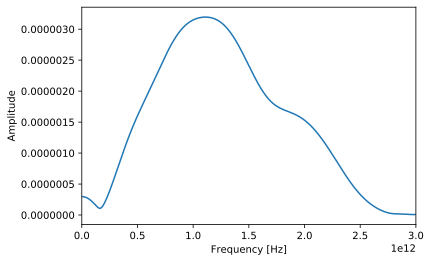

In [682]:
data_file = np.genfromtxt('Y6 series Thz/thz_rumbles_steady.csv',dtype = 'float64', delimiter=',',skip_header=2)
time = data_file[:,0]
#values = range(len(data_useful))
Thz_i_no_back = data_file[:,1]
Thz_avg = Thz_i_no_back#-background_f(time, Thz_i_no_back,-7,-3)
#Thz_avg = np.mean(sig,0)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
#ax.set_xscale('log')
Thz = Thz_avg

N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
#plt.plot(t_pad,Thz_pad)
fft_no = np.fft.fft(Thz_pad)


# 1/T = frequency
f = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft_no)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,3e12)

(0, 3000000000000.0)

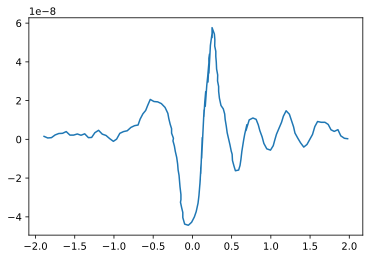

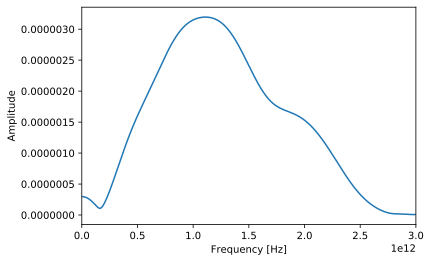

In [683]:
data_file = np.genfromtxt('Y6 series Thz/thz_rumbles_on.csv',dtype = 'float64', delimiter=',',skip_header=2)
time = data_file[:,0]
#values = range(len(data_useful))
Thz_i_no_back = data_file[:,1]*1e-2
Thz_avg = Thz_i_no_back#-background_f(time, Thz_i_no_back,-7,-3)
#Thz_avg = np.mean(sig,0)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
#ax.set_xscale('log')
Thz = Thz_avg

N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
#plt.plot(t_pad,Thz_pad)
fft_on = np.fft.fft(Thz_pad)


# 1/T = frequency
f = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft_no)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,3e12)

(-15, 15)

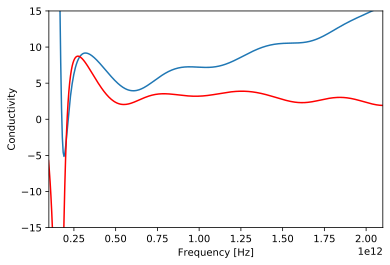

In [687]:
y_pump = (fft_on)/fft_no
#delta_eps = 2*epsilon*y_pump/(1j*np.sqrt(epsilon)*2*np.pi*f*d/c-(np.sqrt(epsilon)-1)/(np.sqrt(epsilon)+1))

#delta_sigma = -2*np.pi*1j*f*ε*(delta_eps-1)
#delta_sigma_approx = -1j*c*np.sqrt(epsilon)/(np.pi*f*d)*y_pump
delta_sigma_approx_2 = -1*ε*c*(1+2.4)/30e-9*y_pump#-2*ε*c*2.4/d*y_pump#-1*(2.4+1)/(337*d)*y_pump#from Yi Liao 2020

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:-1],delta_sigma_approx_2.real)
ax.plot(f[:-1],delta_sigma_approx_2.imag,color = "red")
ax.set_ylabel("Conductivity")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0.1e12,2.1e12)
ax.set_ylim(-15,15)
#ax.set_ylim(-2,2)

(0, 3000000000000.0)

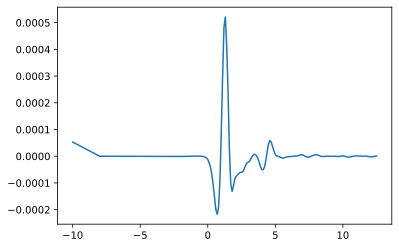

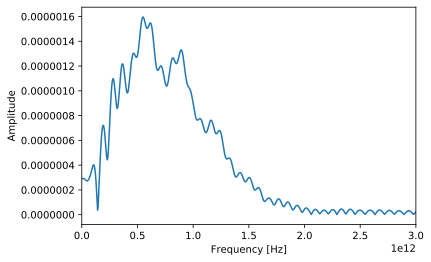

In [733]:
data = glob.glob('Y6 series Thz/Y6_polyTPD_blend_steady/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,0]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-7,-3)
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
#ax.set_xscale('log')
Thz = Thz_avg#*np.hanning(Thz_avg.size)
Thz_off = Thz
N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
#plt.plot(t_pad,Thz_pad)
fft_no = np.fft.fft(Thz_pad)


# 1/T = frequency
f_no = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft_no)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,3e12)

(0, 3000000000000.0)

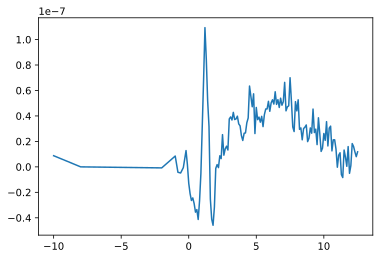

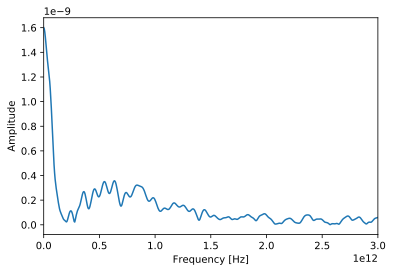

In [734]:
data = glob.glob('Y6 series Thz/Y6_polyTPD_blend_40ps_spec_10mW_2/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,0]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-7,-3)
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
#ax.set_xscale('log')
Thz = Thz_avg#*np.hanning(Thz_avg.size)
Thz_on = Thz
N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
#plt.plot(t_pad,Thz_pad)
fft_on = np.fft.fft(Thz_pad)


# 1/T = frequency
f = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft_on)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,3e12)

(-50, 50)

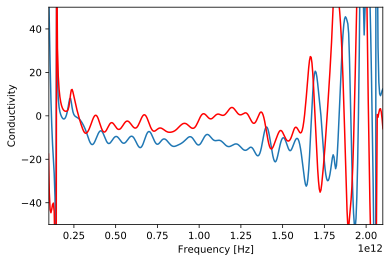

In [728]:
y_pump = (fft_on[:N_size // 2])/fft_no[:N_size // 2]
#delta_eps = 2*epsilon*y_pump/(1j*np.sqrt(epsilon)*2*np.pi*f*d/c-(np.sqrt(epsilon)-1)/(np.sqrt(epsilon)+1))

#delta_sigma = -2*np.pi*1j*f*ε*(delta_eps-1)
#delta_sigma_approx = -1j*c*np.sqrt(epsilon)/(np.pi*f*d)*y_pump
delta_sigma_approx_2 = (-1*ε*c*(2.4+1)/150e-9)*y_pump#from joyce jonshton#-2*ε*c*2.4/d*y_pump from rumbles or -1*(2.4+1)/(337*d)*y_pump#from Yi Liao 2020

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2],delta_sigma_approx_2[:N_size // 2].real)
ax.plot(f[:N_size // 2],delta_sigma_approx_2[:N_size // 2].imag,color = "red")
ax.set_ylabel("Conductivity")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0.1e12,2.1e12)
ax.set_ylim(-50,50)
#ax.set_ylim(-2,2)

(0, 3000000000000.0)

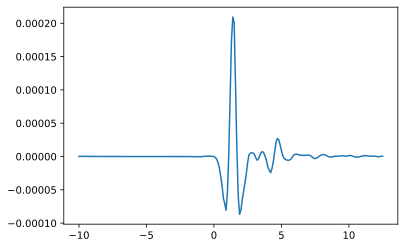

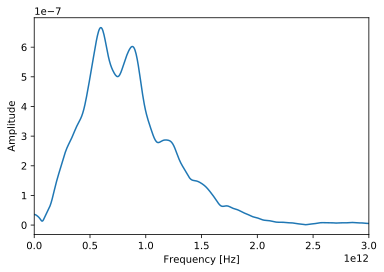

In [735]:
data = glob.glob('Y6 series Thz/Y6_thick_steady/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,0]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-7,-3)
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
#ax.set_xscale('log')
Thz = Thz_avg#*np.hanning(Thz_avg.size)
Thz_off= Thz
N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
#plt.plot(t_pad,Thz_pad)
fft_no = np.fft.fft(Thz_pad)


# 1/T = frequency
f_no = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft_no)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,3e12)

(0, 3000000000000.0)

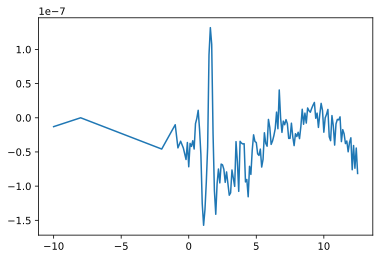

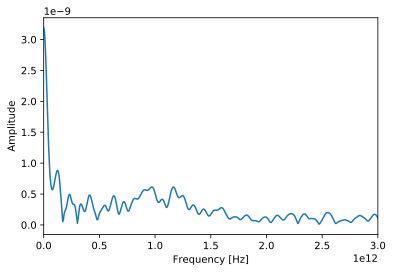

In [736]:
data = glob.glob('Y6 series Thz/Y6_thick_4ps_6mW_spec/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,0]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-7,-3)
    sig.append(Thz_i)
Thz_avg = np.mean(sig,0)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
#ax.set_xscale('log')
Thz = Thz_avg#*np.hanning(Thz_avg.size)
Thz_on = Thz
N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
#plt.plot(t_pad,Thz_pad)
fft_on = np.fft.fft(Thz_pad)


# 1/T = frequency
f = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft_on)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,3e12)

(-250, 250)

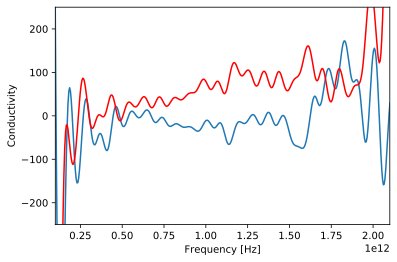

In [732]:
y_pump = (fft_on[:N_size // 2])/fft_no[:N_size // 2]
#delta_eps = 2*epsilon*y_pump/(1j*np.sqrt(epsilon)*2*np.pi*f*d/c-(np.sqrt(epsilon)-1)/(np.sqrt(epsilon)+1))

#delta_sigma = -2*np.pi*1j*f*ε*(delta_eps-1)
#delta_sigma_approx = -1j*c*np.sqrt(epsilon)/(np.pi*f*d)*y_pump
delta_sigma_approx_2 = (-1*ε*c*(2.4+1)/150e-9)*y_pump#from joyce jonshton#-2*ε*c*2.4/d*y_pump from rumbles or -1*(2.4+1)/(337*d)*y_pump#from Yi Liao 2020

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2],delta_sigma_approx_2[:N_size // 2].real)
ax.plot(f[:N_size // 2],delta_sigma_approx_2[:N_size // 2].imag,color = "red")
ax.set_ylabel("Conductivity")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0.1e12,2.1e12)
ax.set_ylim(-250,250)
#ax.set_ylim(-2,2)

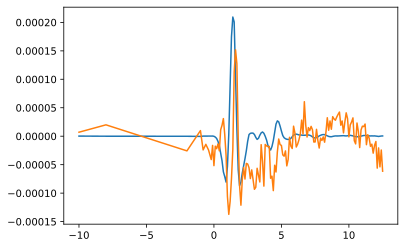

In [740]:
plt.plot(time,Thz_off)
plt.plot(time,Thz_on*1000+.00002)

(0, 3000000000000.0)

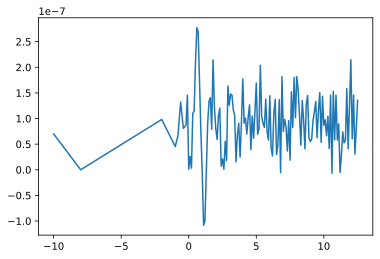

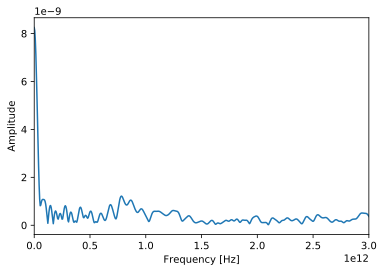

In [4]:
data = glob.glob('Y6 series Thz/Y6_dropcast_dual_chop_fluence1_1ps/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,0]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-7,-3)
    sig.append(Thz_i)
    
Thz_avg = np.mean(sig[:-2],0)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
#ax.set_xscale('log')
Thz = Thz_avg#*np.hanning(Thz_avg.size)
Thz_on = Thz
N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
#plt.plot(t_pad,Thz_pad)
fft_on = np.fft.fft(Thz_pad)


# 1/T = frequency
f = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft_on)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,3e12)




(0, 3000000000000.0)

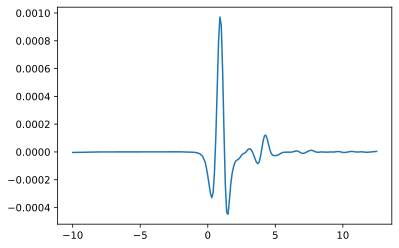

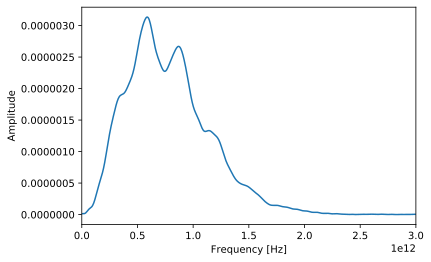

In [5]:
data = glob.glob('Y6 series Thz/Y6_dropcast_dual_chop_fluence1_1ps/*.csv') #N.B. put all files into subfolder. 
data_useful = data[1::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',')  
    #Thz_i = Thz_indiv_r[:,0]
    Thz_i_no_back = Thz_indiv_r[:,1]
    Thz_i = Thz_i_no_back-background_f(time, Thz_i_no_back,-7,-3)
    sig.append(Thz_i)
    
Thz_avg = np.mean(sig[:-2],0)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(time,Thz_avg)
#ax.set_xscale('log')
Thz = Thz_avg#*np.hanning(Thz_avg.size)
Thz_on = Thz
N_size = 2048

spacing = .1 #in ps
t_interp =np.arange(time[0]-spacing,time[-1]+spacing,spacing)
Thz_interp_f = interp1d(time,Thz,fill_value="extrapolate")
Thz_interp = Thz_interp_f(t_interp)
size_pad = np.int_((N_size-t_interp.size)/2)
Thz_pad = np.pad(Thz_interp,(size_pad,size_pad),'constant',constant_values=(0,0))
t_pad = np.arange(time[0]-spacing-size_pad*spacing,time[-1]+spacing+size_pad*spacing,spacing) #in picoseconds
#plt.plot(t_pad,Thz_pad)
fft_no = np.fft.fft(Thz_pad)


# 1/T = frequency
f = np.linspace(0, 1 / (spacing*1e-12), N_size)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2], np.abs(fft_no)[:N_size // 2] * 1 / N_size)
ax.set_ylabel("Amplitude")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0,3e12)



(-50, 50)

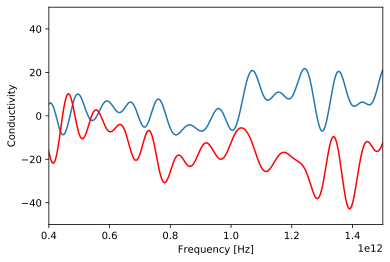

In [6]:
y_pump = (fft_on[:N_size // 2])/fft_no[:N_size // 2]
#delta_eps = 2*epsilon*y_pump/(1j*np.sqrt(epsilon)*2*np.pi*f*d/c-(np.sqrt(epsilon)-1)/(np.sqrt(epsilon)+1))

#delta_sigma = -2*np.pi*1j*f*ε*(delta_eps-1)
#delta_sigma_approx = -1j*c*np.sqrt(epsilon)/(np.pi*f*d)*y_pump
delta_sigma_approx_2 = (-1*ε*c*(2.4+1)/150e-9)*y_pump#from joyce jonshton#-2*ε*c*2.4/d*y_pump from rumbles or -1*(2.4+1)/(337*d)*y_pump#from Yi Liao 2020

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(f[:N_size // 2],delta_sigma_approx_2[:N_size // 2].real)
ax.plot(f[:N_size // 2],delta_sigma_approx_2[:N_size // 2].imag,color = "red")
ax.set_ylabel("Conductivity")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0.4e12,1.5e12)
ax.set_ylim(-50,50)

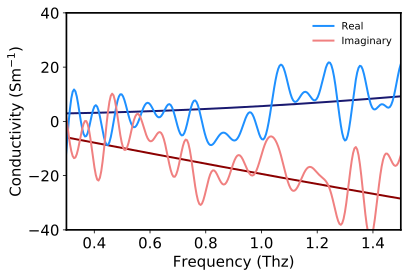

In [97]:
### modified drude smith formula
freq = f[:N_size//2]
epsilon_0 = 8.854187e-12### F.m-1
tau_scatter = 12e-15
nn = 1e16*1e6
m_e = 1.7*mass_e
plasma = 20e12#nn*q**2/(epsilon_0*m_e)
c_1 = -.99
sigma_sim= 2*np.pi*(plasma**2*epsilon_0*tau_scatter/(1-1j*2*np.pi*freq*tau_scatter))*(1+c_1/(1-1j*2*np.pi*freq*tau_scatter))
#have added in 2pi becuase freq rather than omega(rads)


fig = plt.figure()
ax = fig.add_subplot(111)
for i in iter(ax.spines.values()):
    i.set_linewidth(1.7) 
ax.tick_params(axis='both', which='major', labelsize=15)
ax.plot(freq*1e-12,sigma_sim.real,color = 'midnightblue',linewidth = 2)
ax.plot(freq*1e-12,sigma_sim.imag,color = 'darkred',linewidth = 2)
ax.plot(f[:N_size // 2]*1e-12,delta_sigma_approx_2[:N_size // 2].real,color = 'dodgerblue',linewidth = 2,label = 'Real')
ax.plot(f[:N_size // 2]*1e-12,delta_sigma_approx_2[:N_size // 2].imag,color = 'lightcoral',linewidth = 2,label = 'Imaginary')
ax.set_ylabel("Conductivity (Sm$^{-1}$)",fontsize = 15)
ax.set_xlabel("Frequency (Thz)",fontsize = 15)
ax.set_xlim(0.3,1.5)
ax.set_ylim(-40,40)
ax.legend(frameon = False)
#fig.savefig('Thz_sim.svg', bbox_inches='tight')

In [110]:
wavelength = 800e-9
thickness = 80e-9
k = 1.4 #from kerremans, Armin et al. 
alpha = 4*np.pi*k/wavelength
absorption_depth = 1/alpha
absorption_depth*1e9

# OD = -np.log10(np.exp(-alpha*thickness))
# absorb = (1-10**(-OD))
# reprate = 1500
# FWHM = 2e-3
# power_steady = PLQE_power*1e-6
# nn_data = absorb*power_steady/((h*c/wavelength)*np.pi*(FWHM/2)**2*thickness*reprate)*1e-6




45.47284088339867

In [111]:
nn = 10e15*1e6

m_e = nn*q**2/(epsilon_0*plasma**2)
print(m_e/mass_e)

0.07956519171066266


In [105]:
m_e = .5*mass_e
n = plasma**2*epsilon_0*m_e/(q**2)*1e-6
print(n*1e-15)

62.841550337519536


C:\Users\pricemi\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  amin, amax, isave, dsave)



Parameter Value        Standard Deviation
c_1       2.103552e+03+1.737213e-18j 3.114466e+07+2.700547e+07j
plasma    8.411208e+03+1.237076e-07j 7.186596e+07+6.231430e+07j
tau_scatter4.206104e+03+1.633503e-23j 6.224506e+07+5.397229e+07j
Status message         Desired error not necessarily achieved due to precision loss.
Number of iterations   1
Objective              <symfit.core.objectives.LeastSquares object at 0x00000265CCA08408>
Minimizer              <symfit.core.minimizers.BFGS object at 0x00000265CCA081C8>

Goodness of fit qualifiers:
chi_squared            18460886738.516174
objective_value        9230443369.258087
r_squared              (0.05938320917700757+0.010413054522312783j)


TypeError: can't convert expression to float

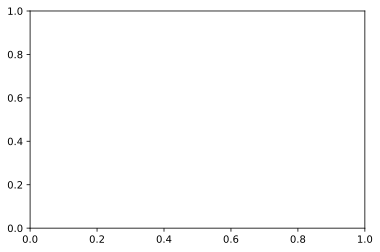

In [25]:
freq_1, s = variables('freq_1, s')
plasma, tau_scatter, c_1 = parameters('plasma, tau_scatter, c_1')

model = Model({
    s: (2*np.pi*(plasma**2*epsilon_0*tau_scatter/(1-1j*2*np.pi*freq_1*tau_scatter))*(1+c_1/(1-1j*2*np.pi*freq_1*tau_scatter))),
})

fit = Fit(model, freq_1=f[:N_size//2], s=delta_sigma_approx_2[:N_size // 2])
fit_result = fit.execute()

print(fit_result)

conductivity = model(freq_1=freq, **fit_result.params)

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(freq,conductivity)
ax.plot(freq,conductivity,color = "red")
ax.plot(f[:N_size // 2],delta_sigma_approx_2[:N_size // 2].real)
ax.plot(f[:N_size // 2],delta_sigma_approx_2[:N_size // 2].imag,color = "red")
ax.set_ylabel("Conductivity")
ax.set_xlabel("Frequency [Hz]")
ax.set_xlim(0.1e12,1.5e12)



In [6]:
R_abs_br = np.log(10**(-.1158))/(np.log(10**(-.033)))
print(R_abs_br)
R_abs_I = np.log(10**(-.2778))/(np.log(10**(-.039)))
print(R_abs_I)

3.50909090909091
7.12307692307692


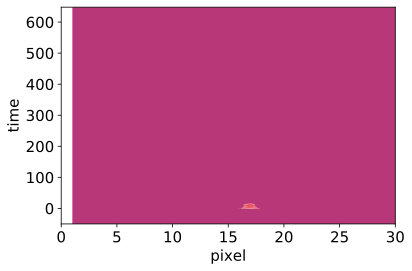

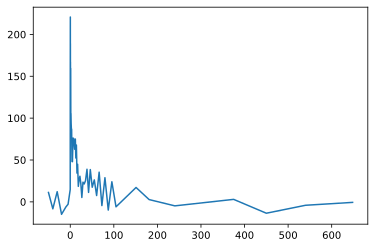

In [145]:
data = glob.glob('Y6 upconversion/Y6 130uW/*.csv') #N.B. put all files into subfolder. 
data_useful = data[0::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',',skip_header=2)  
    #Thz_i = Thz_indiv_r[:,0]
    #Thz_i_no_back = Thz_indiv_r[:,1]
    Thz_i = Thz_indiv_r[:,1:-1]#-background_f(time, Thz_i_no_back,-7,-3)
    sig.append(Thz_i)
    
Thz_avg = np.mean(sig,0)

x = 1+np.arange(1024)

fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_xlabel('pixel', fontsize= 15)
ax.set_ylabel('time', fontsize= 15)
quadmesh = ax.contourf(x,time, Thz_avg, cmap='magma')
ax.set_xlim(0,30)

PL_130_no_back = Thz_avg[:,15:20]
PL_130 = np.mean((PL_130_no_back-815),1)

fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.plot(time,PL_130)

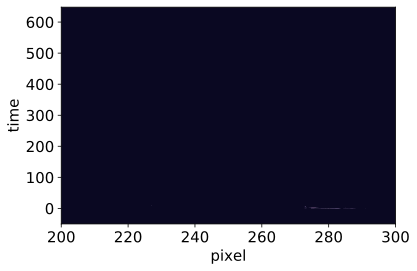

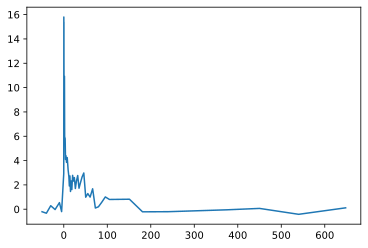

In [146]:
data = glob.glob('Y6 upconversion/Y6 30uW/*.csv') #N.B. put all files into subfolder. 
data_useful = data[0::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',',skip_header=2)  
    #Thz_i = Thz_indiv_r[:,0]
    #Thz_i_no_back = Thz_indiv_r[:,1]
    Thz_i = Thz_indiv_r[:,1:-1]#-background_f(time, Thz_i_no_back,-7,-3)
    sig.append(Thz_i)
    
Thz_avg = np.mean(sig,0)

x = 1+np.arange(512)
fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_xlabel('pixel', fontsize= 15)
ax.set_ylabel('time', fontsize= 15)
quadmesh = ax.contourf(x,time, Thz_avg[:,0:512], cmap='magma')
ax.set_xlim(200,300)
PL_30_no_back = Thz_avg[:,260:300]
PL_30 = np.mean((PL_30_no_back - 607),1)
fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.plot(time,PL_30)

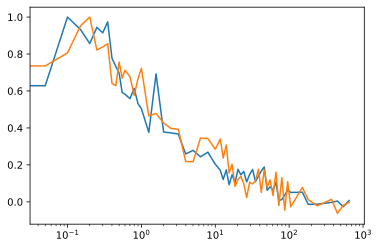

In [148]:
fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.plot(time,PL_30/max(PL_30))
ax.plot(time,PL_130/max(PL_130))
ax.set_xscale('log')

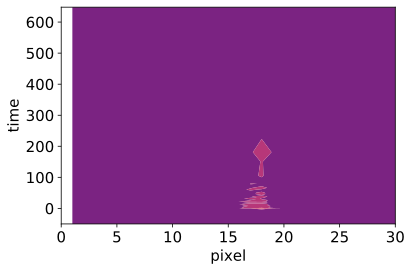

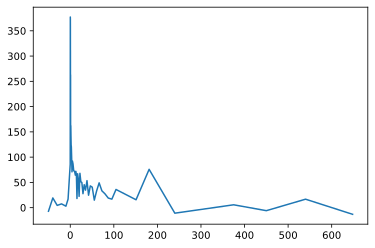

In [156]:
data = glob.glob('Y6 upconversion/Y6 70uW/*.csv') #N.B. put all files into subfolder. 
data_useful = data[0::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',',skip_header=2)  
    #Thz_i = Thz_indiv_r[:,0]
    #Thz_i_no_back = Thz_indiv_r[:,1]
    Thz_i = Thz_indiv_r[:,1:-1]#-background_f(time, Thz_i_no_back,-7,-3)
    sig.append(Thz_i)
    
Thz_avg = np.mean(sig,0)

x = 1+np.arange(512)
fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_xlabel('pixel', fontsize= 15)
ax.set_ylabel('time', fontsize= 15)
quadmesh = ax.contourf(x,time, Thz_avg[:,0:512], cmap='magma')
ax.set_xlim(0,30)
PL_70_no_back = Thz_avg[:,15:20]
PL_70 = np.mean((PL_70_no_back - 816),1)
fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.plot(time,PL_70)

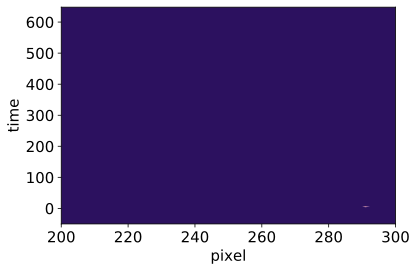

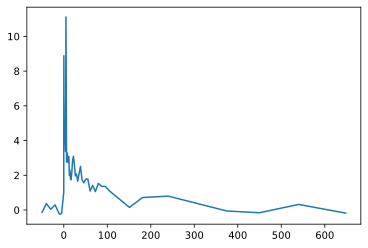

In [161]:
data = glob.glob('Y6 upconversion/Y6 10uW/*.csv') #N.B. put all files into subfolder. 
data_useful = data[0::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',',skip_header=2)  
    #Thz_i = Thz_indiv_r[:,0]
    #Thz_i_no_back = Thz_indiv_r[:,1]
    Thz_i = Thz_indiv_r[:,1:-1]#-background_f(time, Thz_i_no_back,-7,-3)
    sig.append(Thz_i)
    
Thz_avg = np.mean(sig,0)

x = 1+np.arange(512)
fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_xlabel('pixel', fontsize= 15)
ax.set_ylabel('time', fontsize= 15)
quadmesh = ax.contourf(x,time, Thz_avg[:,0:512], cmap='magma')
ax.set_xlim(200,300)
PL_10_no_back = Thz_avg[:,260:300]
PL_10 = np.mean((PL_10_no_back - 604),1)
fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.plot(time,PL_10)

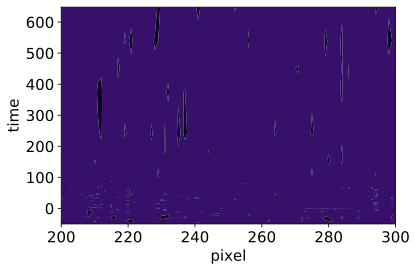

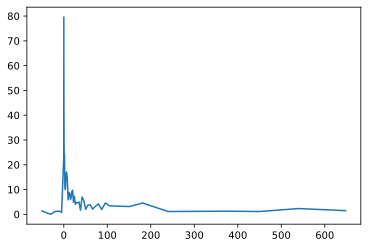

In [163]:
data = glob.glob('Y6 upconversion/Y6 180uW/*.csv') #N.B. put all files into subfolder. 
data_useful = data[0::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',',skip_header=2)  
    #Thz_i = Thz_indiv_r[:,0]
    #Thz_i_no_back = Thz_indiv_r[:,1]
    Thz_i = Thz_indiv_r[:,1:-1]#-background_f(time, Thz_i_no_back,-7,-3)
    sig.append(Thz_i)
    
Thz_avg = np.mean(sig,0)

x = 1+np.arange(512)
fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_xlabel('pixel', fontsize= 15)
ax.set_ylabel('time', fontsize= 15)
quadmesh = ax.contourf(x,time, Thz_avg[:,0:512], cmap='magma')
ax.set_xlim(200,300)
PL_180_no_back = Thz_avg[:,260:300]
PL_180 = np.mean((PL_180_no_back - 602),1)
fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.plot(time,PL_180)

In [216]:
import win32clipboard as clipboard

def toClipboardForExcel(array):
    """
    Copies an array into a string format acceptable by Excel.
    Columns separated by \t, rows separated by \n
    """
    # Create string from array
    line_strings = []
    for line in array:
        line_strings.append("\t".join(line.astype(str)).replace("\n",""))
    array_string = "\r\n".join(line_strings)

    # Put string into clipboard (open, clear, set, close)
    clipboard.OpenClipboard()
    clipboard.EmptyClipboard()
    clipboard.SetClipboardText(array_string)
    clipboard.CloseClipboard()

In [232]:
mat = [time, PL_10, PL_30, PL_70, PL_180]
np.savetxt("Y6_PL_fluence.csv", mat, delimiter=",")


In [228]:
toClipboardForExcel(PL_10_1)

(-5, 10)

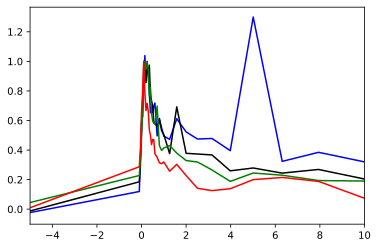

In [210]:
fig = plt.figure()
ax=fig.add_subplot(111, label="1")
#ax.plot(time,(PL_5_2/max(PL_5_2))*1.1,color = 'cyan')
ax.plot(time,(PL_10/max(PL_10))*1.3,color = 'blue')
ax.plot(time,PL_30/max(PL_30),color = 'black')
#ax.plot(time,PL_30_2/max(PL_30_2),color = 'purple')
ax.plot(time,PL_70/max(PL_70),color = 'green')
#ax.plot(time,PL_130/max(PL_130),color = 'orange')
ax.plot(time,PL_180/max(PL_180),color = 'red')
#ax.plot(time,PL_200_2/max(PL_200_2),color = 'brown')
#ax.set_xscale('log')
ax.set_xlim(-5,10)

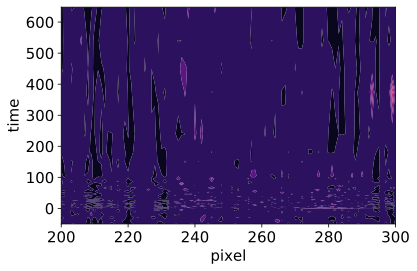

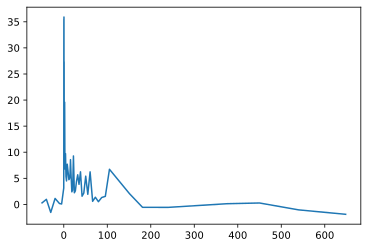

In [179]:
data = glob.glob('Y6 upconversion/Y6 30uW new sample/*.csv') #N.B. put all files into subfolder. 
data_useful = data[0::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',',skip_header=2)  
    #Thz_i = Thz_indiv_r[:,0]
    #Thz_i_no_back = Thz_indiv_r[:,1]
    Thz_i = Thz_indiv_r[:,1:-1]#-background_f(time, Thz_i_no_back,-7,-3)
    sig.append(Thz_i)
    
Thz_avg = np.mean(sig,0)

x = 1+np.arange(512)
fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_xlabel('pixel', fontsize= 15)
ax.set_ylabel('time', fontsize= 15)
quadmesh = ax.contourf(x,time, Thz_avg[:,0:512], cmap='magma')
ax.set_xlim(200,300)
PL_30_2_no_back = Thz_avg[:,270:290]
PL_30_2 = np.mean((PL_30_2_no_back - 602.5),1)
fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.plot(time,PL_30_2)

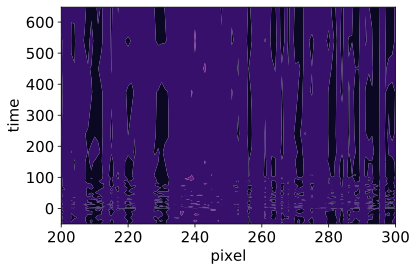

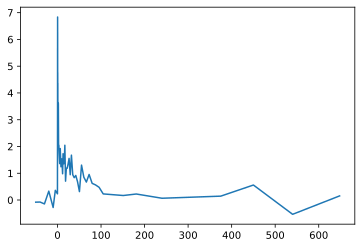

In [183]:
data = glob.glob('Y6 upconversion/Y6 5uW new sample/*.csv') #N.B. put all files into subfolder. 
data_useful = data[0::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',',skip_header=2)  
    #Thz_i = Thz_indiv_r[:,0]
    #Thz_i_no_back = Thz_indiv_r[:,1]
    Thz_i = Thz_indiv_r[:,1:-1]#-background_f(time, Thz_i_no_back,-7,-3)
    sig.append(Thz_i)
    
Thz_avg = np.mean(sig,0)

x = 1+np.arange(512)
fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_xlabel('pixel', fontsize= 15)
ax.set_ylabel('time', fontsize= 15)
quadmesh = ax.contourf(x,time, Thz_avg[:,0:512], cmap='magma')
ax.set_xlim(200,300)
PL_5_2_no_back = Thz_avg[:,260:300]
PL_5_2 = np.mean((PL_5_2_no_back - 600.55),1)
fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.plot(time,PL_5_2)

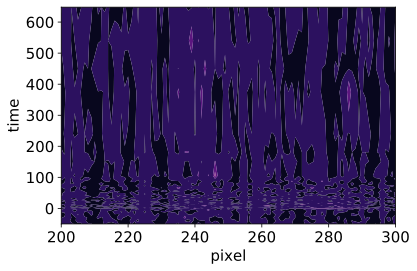

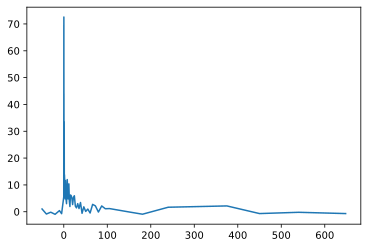

In [184]:
data = glob.glob('Y6 upconversion/Y6 200uW new sample/*.csv') #N.B. put all files into subfolder. 
data_useful = data[0::2]
data_time = data[0]
time_file = np.genfromtxt(data_time,dtype = 'float64', delimiter=',',skip_header=2)
time = time_file[:,0]*1e-3
values = range(len(data_useful))
sig = []
for idx in values:
    path_to_file = data_useful[idx]
    Thz_indiv_r = np.genfromtxt(path_to_file,dtype = 'float64', delimiter=',',skip_header=2)  
    #Thz_i = Thz_indiv_r[:,0]
    #Thz_i_no_back = Thz_indiv_r[:,1]
    Thz_i = Thz_indiv_r[:,1:-1]#-background_f(time, Thz_i_no_back,-7,-3)
    sig.append(Thz_i)
    
Thz_avg = np.mean(sig,0)

x = 1+np.arange(512)
fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_xlabel('pixel', fontsize= 15)
ax.set_ylabel('time', fontsize= 15)
quadmesh = ax.contourf(x,time, Thz_avg[:,0:512], cmap='magma')
ax.set_xlim(200,300)
PL_200_2_no_back = Thz_avg[:,260:300]
PL_200_2 = np.mean((PL_200_2_no_back - 600.55),1)
fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.plot(time,PL_200_2)

C:\Users\pricemi\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:15: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  from ipykernel import kernelapp as app


(0.031141516259923608, 650)

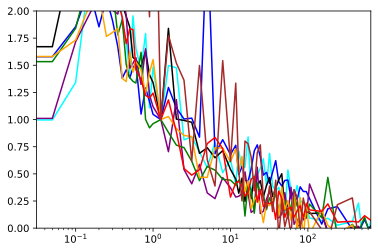

In [200]:
t_norm = 25

fig = plt.figure()
ax=fig.add_subplot(111, label="1")
ax.plot(time,(PL_5_2/(PL_5_2[t_norm])),color = 'cyan')
ax.plot(time,(PL_10/(PL_10[t_norm])),color = 'blue')
ax.plot(time,PL_30/(PL_30[t_norm]),color = 'black')
ax.plot(time,PL_30_2/(PL_30_2[t_norm]),color = 'purple')
ax.plot(time,PL_70/(PL_70[t_norm]),color = 'green')
ax.plot(time,PL_130/(PL_130[t_norm]),color = 'orange')
ax.plot(time,PL_180/(PL_180[t_norm]),color = 'red')
ax.plot(time,PL_200_2/(PL_200_2[t_norm]),color = 'brown')
ax.set_xscale('log')
ax.set_ylim(0,2)
ax.set_xlim(-2,650)

In [142]:
volume = 4*np.pi*3**3/3 #of ball in cm3

atom = 4*np.pi*(0.5e-13)**3/3

number_e = volume/atom
amps = number_e/6.2e18
strikes = amps/20000
print(volume, atom, number_e,amps,strikes)

113.09733552923255 5.235987755982988e-40 2.16e+41 3.4838709677419357e+22 1.7419354838709678e+18
